<a href="https://colab.research.google.com/github/affanquresh/Dog-vision/blob/main/Dog_Vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# !unzip "/content/drive/MyDrive/dog-breed-identification.zip" -d "/content/drive/MyDrive/ "

In [ ]:
#

# 🐶 End-to-end Dog breed classifier model
This notebook builda an end-to-end multiclass image classifier using TensorfFLow 2.o and TensorFlow Hub
# 1.problem
Identifying the breed of a dog given an image of a dog
# 2.Data
The data is from kaggles fog breed identification competition
https://www.kaggle.com/competitions/dog-breed-identification/data
# 3.Evaluation
 The evaluation file is the prediction of each dog breed for each text image
# 4.Feature

some information about the data


# Get our workspace ready

In [ ]:
pip install tensorflow==2.15.0 tensorflow-hub keras==2.15.0

INFO: pip is looking at multiple versions of tf-keras to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 475.3/475.3 MB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 59.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 108.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 442.0/442.0 kB 33.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 70.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.4/78.4 kB 7.7 MB/s eta 0:00:00
  Attempting uninstall: wrapt
    Found existing installation: wrapt 1.17.2
    Uninstalling wrapt-1.17.2:
      Successfully uninstalled wrapt-1.17.2
  Attempting uninstall: ml-dtypes
    Found existing installation: ml-dtypes 0.4.1
    Uninstalling ml-dtypes-0.4.1:
      Successfully uninstalled ml-dtypes

# Import TensorFlow

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
print("TensorFlow hub version",hub.__version__)
print("TensorFlow version:",tf.__version__)

#check for GPU  availablity
print("GPU","available(YESSSS!!!!)" if tf.config.list_physical_devices("GPU") else print("GPU not found"))

TensorFlow hub version 0.16.1
TensorFlow version: 2.15.0
GPU not found
GPU None


## Getting our data ready (turning data into tensors)
all machine learning models deals with numerical format, therefore we'll be first turning our data in tensors(numerical )format

check out labels of our data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [164]:
import pandas as pd
label_csv=pd.read_csv("/content/drive/MyDrive/dog-vision/ /labels.csv")
(label_csv.head())

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
label_csv["breed"].value_counts()

,count
breed,
scottish_deerhound,126
maltese_dog,117
afghan_hound,116
entlebucher,115
bernese_mountain_dog,114
...,...
golden_retriever,67
komondor,67
brabancon_griffon,67


In [ ]:
label_csv["breed"].value_counts().median()


82.0

## The number of example tell how well our model is going to train on specific dog breed
## hights no. of examples are of scottish_deerhound	that means our model is going to train on scottish_deerhound breed as compare to the breed with lower counts of example

<Axes: xlabel='breed'>

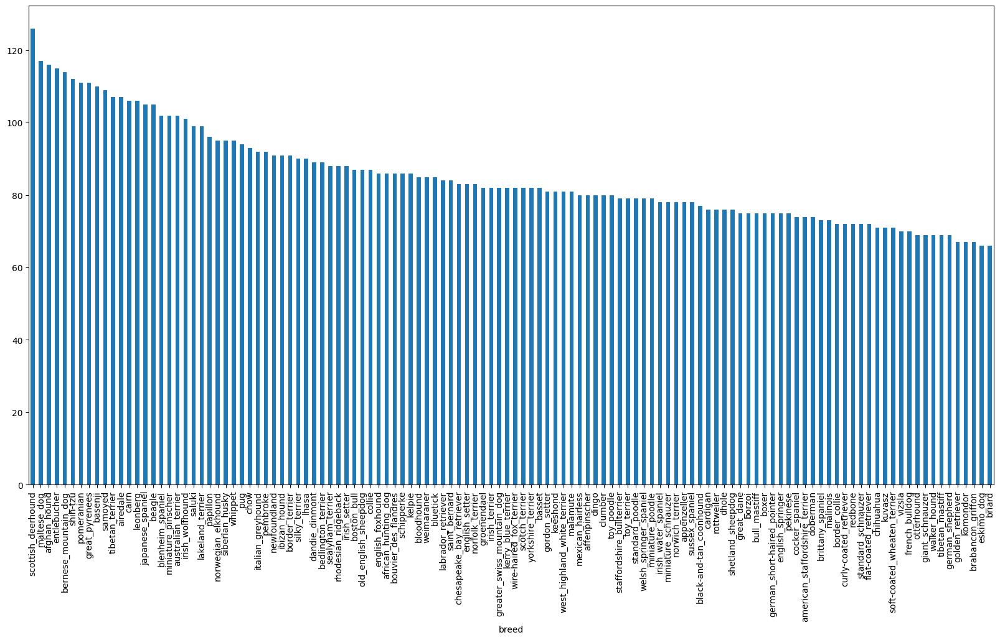

In [ ]:
label_csv["breed"].value_counts().plot.bar(figsize=(20,10))

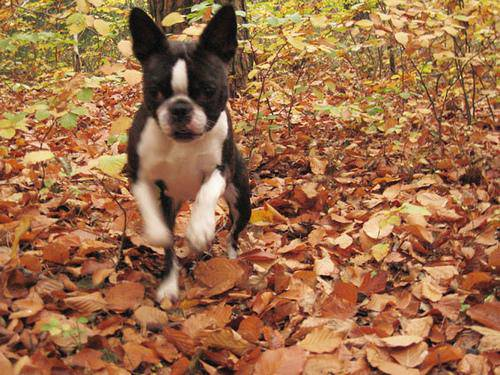

In [ ]:
from IPython.display import Image
Image("/content/drive/MyDrive/dog-vision/ /train/000bec180eb18c7604dcecc8fe0dba07.jpg")

# Getting the file path of the image

In [ ]:
filename= ["/content/drive/MyDrive/dog-vision/ /train/"+ fid+".jpg" for fid in label_csv["id"]]
filename[:10]


['/content/drive/MyDrive/dog-vision/ /train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/dog-vision/ /train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/dog-vision/ /train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/dog-vision/ /train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/dog-vision/ /train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/dog-vision/ /train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/dog-vision/ /train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/dog-vision/ /train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/dog-vision/ /train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/dog-vision/ /train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
##check whethe the number of file name matched number image files
import os
if len(os.listdir("/content/drive/MyDrive/dog-vision/ /train"))==len(filename):
  print("filenames matched")
else:
    print("filenames did not matched")

filenames matched


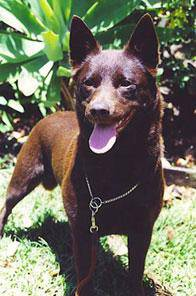

In [ ]:
Image(filename[800])

In [165]:
label_csv["breed"][800]

'kelpie'

### since we have got our training images filepath now lets prepare labels


In [ ]:
import numpy as np
labels=label_csv["breed"]
labels=np.array(labels)
len(labels)

10222

In [ ]:
#check for the unique breeds of dog
unique_breeds=np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [167]:
labels[0]==unique_breeds
labels[5]

'bedlington_terrier'

In [170]:
boolean_label=[label==unique_breeds for label in labels ]
boolean_label[5]

array([False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# turning boolean array into an integer
print(labels[0]) # prints the label
print(np.where(labels[0]==unique_breeds)) # gives the position of label in the unique breeds array
print(boolean_label[0].argmax()) # tells the position of label in boolean_label array
print(boolean_label[0].astype(int)) # returns the output in the form of 0 and 1


boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:

print(labels[9000])
print(boolean_label[9000].argmax())
print(boolean_label[9000].astype(int))

tibetan_mastiff
108
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0
 0 0 0 0 0 0 0 0 0]


# creating our own validation set

In [ ]:
# setup x and y variable
x=filename
y=boolean_label


# we are going to start experiment from 1000 images and then increase it as we needed

In [ ]:
# set the number of images for experiment
NUM_IMAGES=1000 #@param{type:"slider",min:1000,max:10000,step:1000}

# using SKlearn

In [ ]:
# lets split our data into train and validation
from sklearn.model_selection import train_test_split

x_train,x_val,y_train,y_val=train_test_split(x[:NUM_IMAGES],y[:NUM_IMAGES],test_size=0.2,random_state=42)
len(x_train),len(x_val),len(y_train),len(y_val)

(800, 200, 800, 200)

In [ ]:
x[:2],y[:2]

(['/content/drive/MyDrive/dog-vision/ /train/000bec180eb18c7604dcecc8fe0dba07.jpg',
  '/content/drive/MyDrive/dog-vision/ /train/001513dfcb2ffafc82cccf4d8bbaba97.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False,  True, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, Fa

# PreProcessing images(turning it into tensors)
To preprocess our images into Tensor's we will write a function that does few things:
1. Take images filepaths into inputs
2. use tensorflow to read the files and save it to a variable,image
3. Turn our image(a jpg) into tensors
4. NOrmalize images(convert color channel from 0-255 to 0-1)
5. Resize the image to be shape of(224,224)
6. Return the modified image

In [ ]:
# convert images to numpy array
from matplotlib.pyplot import imread
image=imread(filename[42])
image.shape

(257, 350, 3)

In [ ]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [ ]:
#turns image into tensor
tf.constant(image[:2])

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [ ]:
# Define image size
IMG_SIZE=224
# CREATE A FUCTION FOR PREPROCESSION IMAGES
def process_image(image_path,image_size=IMG_SIZE):
  """take image's file path and turn it into a tensor"""
  #read the image path
  image=tf.io.read_file(image_path)
  #conver jpeg image into tensor with 3 color channel(RGB)
  image=tf.image.decode_jpeg(image,channels=3)
  #conver color channels from 0-255 to 0-1
  image=tf.image.convert_image_dtype(image,tf.float32)
  #resize image
  image=tf.image.resize(image,size=[image_size,image_size])
  return image


# Turning our data into Batch
why turning our data into batches?

Training our data on a whole 10,000 image may not be a good idea as it will use lots of memory and energy.

Thats why we turn our data into Batches(size of a single batch is 32)

### In order to use tensorflow effectively we need our data in the form of Tensor Tuple which looks like this `(image,label)`

In [ ]:
def get_image_label(image_path,label):
  """
  Takes the image file path and the associated label ,processes it and returns a tuple of image and label
  """
  image=process_image(image_path)
  return image,label

In [ ]:
#Define the batch size
BATCH_SIZE=32
#create a fuction to turn data into batch
def create_data_batch(x,y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):
  """
  creates the batched of image(x) and label(y) pairs
  shufffles the dats if its a training data and doesn't shuffle if it is a validation data
  also accepts test data input (note that test data does not have labels)
  """
  # if data is testdata we probably dont have label
  if (test_data):
    print("creating test data batches....")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x)))#only filepath no label
    data_batch=data.map(process_image).batch(BATCH_SIZE)
    print("data batches created")
    return data_batch
  elif (valid_data):
    print("creating validation data batches....")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x),#file path
                                             tf.constant(y)))#label
    data_batch=data.map(get_image_label).batch(BATCH_SIZE)
    print("data batches created")

    return data_batch
  else:
      print("creating Training data batch")
      data=tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                               tf.constant(y)))
      #shuffle pathname and label before processing data for faster results
      data=data.shuffle(buffer_size=len(x))
      #create (image,label) tuple
      data=data.map(get_image_label)
      #turn training data into batches
      data_batch=data.batch(BATCH_SIZE)
      print("data batches created")

      return data_batch



In [ ]:

# creatring training and validation data batches
train_data=create_data_batch(x_train,y_train)
val_data=create_data_batch(x_val,y_val,valid_data=True)

creating Training data batch
data batches created
creating validation data batches....
data batches created


In [ ]:
train_data.element_spec,val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## visualising data batches

In [ ]:
import matplotlib.pyplot as plt
#create a function for viewing images in a data batch
def show_25_images(images,labels):
  """
  takes in a batch of images and labels and plots them
  """
  #setup the figure
  plt.figure(figsize=(10,10))
  #loop through 25(for displaying 25 images)
  for i in range(25):
    #create subplots(5 rows,5 columns)
     ax=plt.subplot(5,5,i+1)
     #display an image
     plt.imshow(images[i])
     #Add image label as title
     plt.title(unique_breeds[labels[i].argmax()])
     #remove axis ticks
     # plt.axis("off")



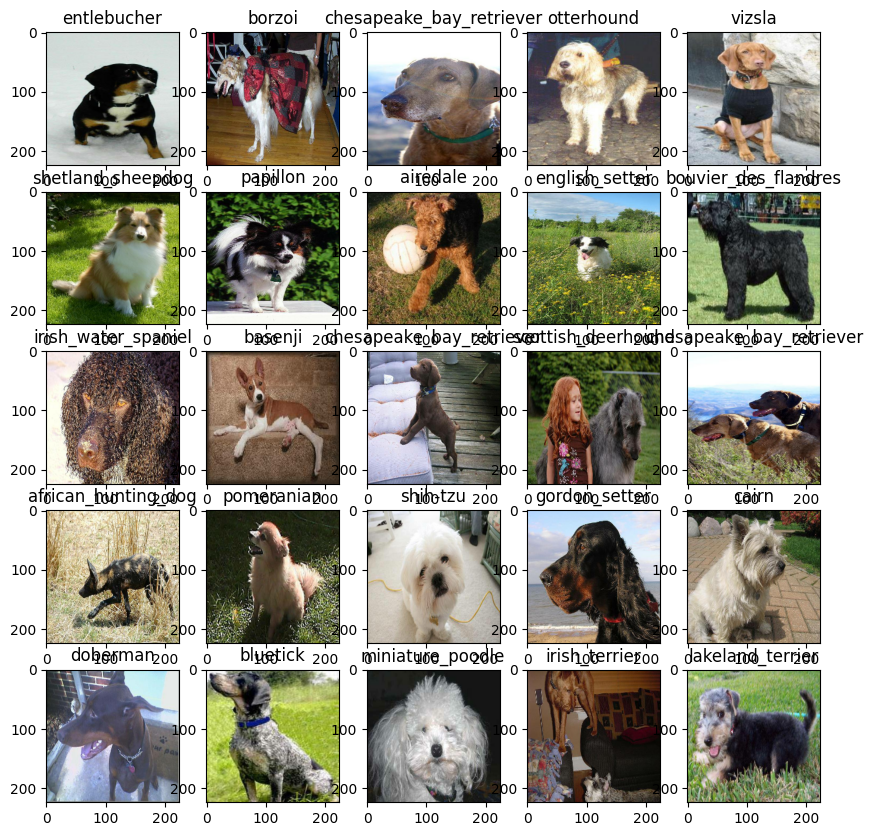

In [ ]:
train_image,train_label=next(train_data.as_numpy_iterator())

show_25_images(train_image,train_label)

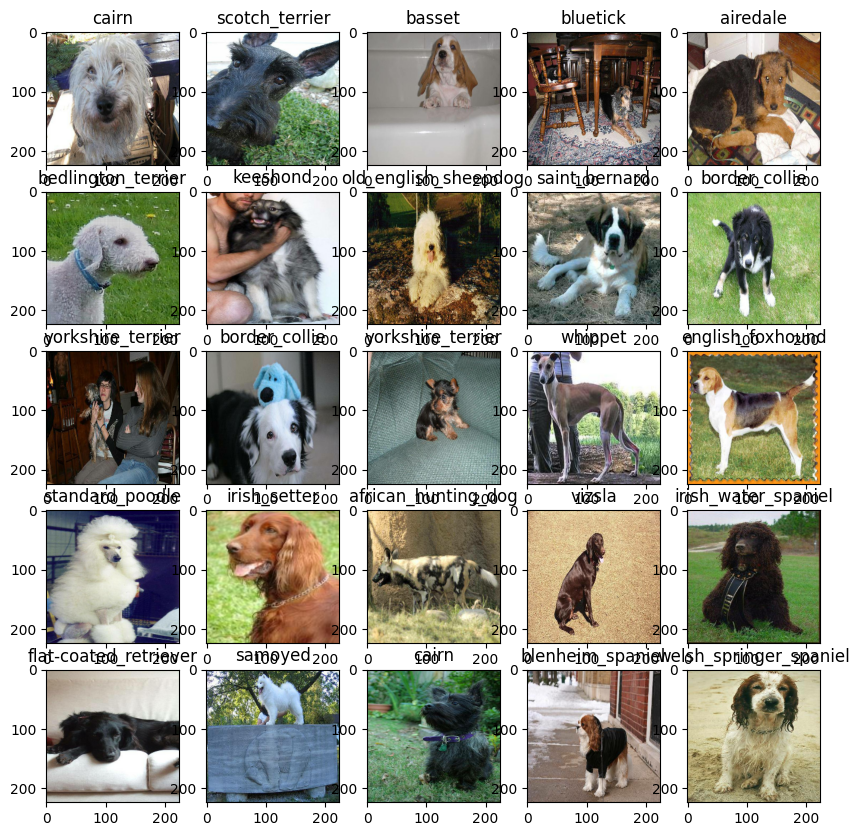

In [ ]:
val_image,val_label=next(val_data.as_numpy_iterator())
show_25_images(val_image,val_label)

# BUilding a Model

Before we build a model,there a few thing we need to define
1. input shapr (images shape) in the form of tensors to the model
2. output shape (label shape) in the form of tensors to thee model
3. URL of the model we want to use

In [ ]:
#setup input shape to the model
INPUT_SHAPE=[None,IMG_SIZE,IMG_SIZE,3]
#setup output shape of the model
OUTPUT_SHAPE=len(unique_breeds)
#setup model URL
MODEL_URL="https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2"

## Now we have got our input ,output and our modelready to go,Lets put them together in to keras Deep learning model

## lets create a fuciton which:
* takes input shape, output shape and model we have chooosen as parameters
* Define layers in keras in sequential ordere(first do this,then that,then that)
* compiles the model(says whether it should be evaluated or improved)
* Builds the model
* Returns the model

In [ ]:
from tensorflow import keras
from tensorflow.keras.layers import Dense
from tensorflow.keras.models import Sequential, load_model


In [ ]:

import tensorflow as tf
import tensorflow_hub as hub
import tf_keras


# create a fuction which builds keras model
def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
  print("building model with url:",MODEL_URL)
  #setup the model layers
  model=tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL),
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,activation="softmax")
  ])
  #compile the model
  model.compile(loss=tf.keras.losses.CategoricalCrossentropy(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=["accuracy"])
  model.build(INPUT_SHAPE)
  return model

In [ ]:
model=create_model()

building model with url: https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/2


In [ ]:
#import tensorboard
%load_ext tensorboard

#creating callbacks
* callbacks arwe helper fuctino our model can use during trainig to do such thinhs such as save its process,check its process or stop training early if model stops improving
* we will create two call backs, one for tensorboard which helps to keep track on models progress and the other for early stopiing which prevents our model from ttaining for too long


# TensorBoard callback
To setup tensorboard callback we have to do 3 things:
1. Load TensorBoard notebook Extension
2. create a tensorboard callback whick is able to save logs to the directory and pass it to the models function
3. visualise our models training logs with th %tensorboard magic function


In [ ]:
import datetime
#create function to build tensorboard callback
def create_tensorboard_callback():
  #create a log directory for storing tensorboard logs
  log_dir=os.path.join("/content/drive/MyDrive/dog-vision/ /logs",datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(log_dir=log_dir)


##Early stopping callback
Early training helps our model to stop overfitting by stopping training if certain evaluation metrics stop improving


In [ ]:
early_stopping=tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",patience=3)

#Training a model
our first model is going to train on only 1000 images

In [ ]:
NUM_EPOCHS=20 #@param{type:"slider",min:10,max:100,step:10}

In [ ]:
def train_model():
  model=create_model()
  tensorboard=create_tensorboard_callback()

  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[create_tensorboard_callback(),early_stopping])
  return model

In [ ]:
def save_model(model,suffix=None):
  modeldir=os.path.join("/content/drive/MyDrive/ /models",datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path=modeldir + "-" + suffix + ".h5"
  model.save(model_path)
  return model_path

In [ ]:
def load_model(model_path):
  print(f"loading saved model from : {model_path}")
  model=tf.keras.models.load_model(model_path,
                                   custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
model=load_model("/content/drive/MyDrive/dog-vision/ /models/20250208-175730-1000-images-mobilenetv2.h5")

loading saved model from : /content/drive/MyDrive/dog-vision/ /models/20250208-175730-1000-images-mobilenetv2.h5


In [ ]:
# save_model(model,suffix="100-images-model")

In [ ]:
%tensorboard --logdir /content/drive/MyDrive/dog-vision/\ /logs

<IPython.core.display.Javascript object>

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

# making and evaluating prediction using trained model

In [ ]:
prediction=model.predict(val_data,verbose=1)

7/7 [==============================] - 187s 31s/step


In [ ]:
prediction

array([[8.22092581e-04, 5.31668411e-05, 2.06985103e-04, ...,
        1.57773960e-04, 6.92299072e-05, 1.07157528e-02],
       [5.47669549e-03, 1.31167076e-03, 3.26046394e-03, ...,
        6.29293092e-04, 7.00607954e-04, 5.46131167e-04],
       [9.56506337e-05, 2.44739768e-03, 1.16856114e-04, ...,
        1.26049985e-04, 2.37005937e-04, 2.18850022e-04],
       ...,
       [6.10615416e-06, 1.78538525e-04, 1.14460481e-05, ...,
        1.50013593e-05, 2.62573070e-04, 1.51991508e-05],
       [3.09041631e-03, 3.66295280e-04, 7.61845586e-05, ...,
        5.95884805e-04, 9.04809785e-05, 3.06131672e-02],
       [2.50841229e-04, 4.53580833e-05, 2.05350318e-03, ...,
        1.08071808e-02, 1.43425725e-03, 2.08207974e-04]], dtype=float32)

In [ ]:
prediction.shape

(200, 120)

In [ ]:
len(y_val)

200

In [ ]:
len(unique_breeds)

120

In [ ]:
index=77
print(prediction[index])
print(f"max value:{np.max(prediction[index])}")
print(f"sum:{np.sum(prediction[index])}")
print(f"max-index:{np.argmax(prediction[index])}")
print(f"predicted label:{unique_breeds[np.argmax(prediction[index])]}")

[1.47470040e-03 1.48479594e-04 5.87895665e-05 4.67530253e-06
 5.06076913e-06 8.00047565e-05 2.08664878e-05 3.25855626e-06
 2.55280756e-05 2.11997053e-06 2.41509024e-05 1.68473634e-05
 7.06296050e-05 7.90853119e-06 2.79363098e-06 8.87191072e-06
 1.64796820e-05 1.14097320e-05 3.22531105e-06 6.28549014e-06
 2.15712294e-04 4.16145594e-05 1.94990434e-06 2.28356930e-05
 2.81749308e-05 9.99026161e-05 9.20328079e-04 7.83666983e-05
 1.83022275e-05 1.41449360e-04 4.65472229e-04 8.99069903e-07
 5.91758089e-06 6.88343644e-05 6.37162884e-05 5.17780063e-05
 2.71871977e-05 6.99945376e-05 9.84944290e-06 1.14838658e-05
 1.07445226e-06 5.16214168e-05 6.01736519e-06 1.48755189e-05
 1.41357799e-04 2.61912901e-05 2.75188486e-05 2.28210210e-05
 4.16273588e-06 1.19298575e-05 1.07891019e-05 8.25470124e-06
 3.38780192e-05 6.13568409e-06 9.62697685e-01 5.20816184e-06
 1.96101792e-05 2.51092865e-06 2.88523097e-06 1.85899316e-05
 2.52036921e-06 2.25080134e-06 1.42176368e-03 5.73551333e-05
 9.96964663e-05 1.526994

# It would be alot better if we are able to see the images the prediction is made on

In [ ]:
# turn probability into their respective labels
def get_pred_label(prediction_probabilities):
  """
  turns an array of probability into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]
  # get the predicted label based on the prediction probability
pred_label=get_pred_label(prediction[9])
pred_label

'collie'

## Since our validation data was in a batch form for tensorfow to make calculations because it is easy for tensorflow to make calculation on batched data,but now as we want to make predictions we will unbatchify our val_data,and then compare those predictions to val_labels(true answer)

In [ ]:
#create a function to unbatch a batched dataset
def unbatchify(data):
  """
  Takes the batched data of (image,label) and unbatched it
  """
  images=[]
  labels=[]
  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images,labels

val_image,val_label=unbatchify(val_data)

In [ ]:
get_pred_label(val_label[9])

'affenpinscher'

In [ ]:
val_label[0],val_image[0]

('cairn',
 array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.9977206

# lets make a function to make all these more visuale

we will create a function that:
* take an array of prediction propability,an array of truth labels and an array of images and integers.
* convert the prediction probability to a predicted label
* plot a predicted label,its predicted probability ,truth label and target image

In [ ]:
 def plot_pred(prediction_probabilities,labels,images,n=90):
  """
  view prediction ,label and image for sample n
  """
  pred_prob,true_label,image=prediction_probabilities[n],labels[n],images[n]
  #Gets preds label
  pred_label=get_pred_label(pred_prob)
  #plot image
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])
  #change plot title
  plt.title("{} {:2.0f}% {}".format(pred_label,pred_prob[np.argmax(pred_prob)]*100,true_label),
             color=("green" if pred_label==true_label else "red"))
  plt.show()






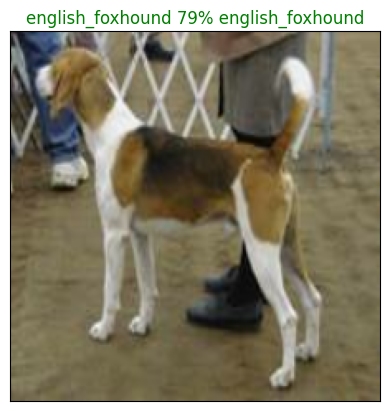

In [ ]:
plot_pred(prediction_probabilities=prediction,labels=val_label,images=val_image)

In [ ]:
# save_model(model,suffix="1000-images-mobilenetv2")

In [ ]:
# full_model=create_model()

In [ ]:
full_model_tensorboard=create_tensorboard_callback()
full_model_early_stopping=tf.keras.callbacks.EarlyStopping(monitor="accuracy",patience=3)

In [ ]:
len(x),len(y)

(10222, 10222)

In [ ]:
# full_data=create_data_batch(x,y)

In [ ]:
full_model=load_model("/content/drive/MyDrive/dog-vision/ /models/20250216-193431-full-model.h5")

loading saved model from : /content/drive/MyDrive/dog-vision/ /models/20250216-193431-full-model.h5


In [ ]:
#load test images file path

In [ ]:
test_path="/content/drive/MyDrive/dog-vision/ /test/"
test_images_path=[test_path + fname for fname in os.listdir(test_path)]
test_images_path[:10]

['/content/drive/MyDrive/dog-vision/ /test/e78b50f1d12148deef4c564ea4c88050.jpg',
 '/content/drive/MyDrive/dog-vision/ /test/e7afb35b8252782013a6700e28e327fa.jpg',
 '/content/drive/MyDrive/dog-vision/ /test/e4b8eb057df510fa776516de19c9fa92.jpg',
 '/content/drive/MyDrive/dog-vision/ /test/e4ba350279796ff15c3a634037a6f88e.jpg',
 '/content/drive/MyDrive/dog-vision/ /test/e70c62f51defaa5295fe3e52099c4ce3.jpg',
 '/content/drive/MyDrive/dog-vision/ /test/e334f758c7944df19c98d49498d28c64.jpg',
 '/content/drive/MyDrive/dog-vision/ /test/dfc5d207b533d381045984a0a0adb23c.jpg',
 '/content/drive/MyDrive/dog-vision/ /test/e09859cae41cb59228518c09c3b27362.jpg',
 '/content/drive/MyDrive/dog-vision/ /test/dd1eddb779b2611cdd42de48ae623a62.jpg',
 '/content/drive/MyDrive/dog-vision/ /test/e2ef94a22af1d5375132de4eb19d2a64.jpg']

In [ ]:
len(test_images_path)

10357

In [ ]:
# create test data batch
test_data=create_data_batch(test_images_path,test_data=True)

creating test data batches....
data batches created


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# make prediction on test data
# test_prediction=full_model.predict(test_data,verbose=1)

In [ ]:
# np.savetxt("/content/drive/MyDrive/dog-vision/ /test_prediction.txt",test_prediction,delimiter=",")

In [ ]:
test_pedictons=np.loadtxt("/content/drive/MyDrive/dog-vision/ /test_prediction.txt",delimiter=",")
test_pedictons[:10]

array([[1.24126631e-12, 4.72543393e-10, 4.85759245e-11, ...,
        4.81934537e-09, 2.97933032e-12, 3.05126001e-14],
       [7.42198317e-12, 2.23110020e-11, 3.42234019e-11, ...,
        3.02683850e-10, 1.37267140e-04, 9.98070550e-12],
       [1.25200772e-09, 1.12777817e-11, 1.29705791e-14, ...,
        8.39032721e-15, 2.27179907e-12, 2.54725269e-11],
       ...,
       [7.97116171e-13, 2.95755434e-11, 2.13733475e-09, ...,
        9.08620540e-11, 9.88974325e-09, 1.26615676e-10],
       [2.66911944e-11, 6.83516710e-15, 6.19955823e-15, ...,
        7.01013202e-16, 4.49531159e-14, 6.49921089e-12],
       [3.29228561e-10, 1.32898650e-10, 4.02527525e-11, ...,
        3.02108241e-08, 8.05657635e-07, 1.04251781e-08]])

# Making prediction on costum images

* get the file path of out imge
* batchify our image using our `creat_data_batch` function
* pass the comtume image batches to the model to pridict
* unbatchify our image
* convert the prediction output probability into prediction table
* compare predicton table to the custome image

In [154]:
custome_data_path="/content/drive/MyDrive/dog-vision/ /custome_image/"


In [155]:
custome_image_path=[custome_data_path + fname for fname in os.listdir(custome_data_path)]
custome_image_path

['/content/drive/MyDrive/dog-vision/ /custome_image/pitbul.jpeg',
 '/content/drive/MyDrive/dog-vision/ /custome_image/03827b9233eadc7e4772a21db4bbe706.jpg',
 '/content/drive/MyDrive/dog-vision/ /custome_image/dog.jpeg']

In [156]:
custome_data=create_data_batch(custome_image_path,test_data=True)

creating test data batches....
data batches created


In [157]:
custome_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [158]:
custome_image_preds=full_model.predict(custome_data,verbose=1)

1/1 [==============================] - 1s 767ms/step


In [159]:
custome_image_preds.shape

(3, 120)

In [160]:
image_prediction=[]
custom_preds=[get_pred_label(custome_image_preds[i]) for i in range(len(custome_image_preds)) ]
custom_preds

['american_staffordshire_terrier', 'samoyed', 'german_shepherd']

In [161]:
custome_image=[];
for image in custome_data.unbatch().as_numpy_iterator():
  custome_image.append(image)

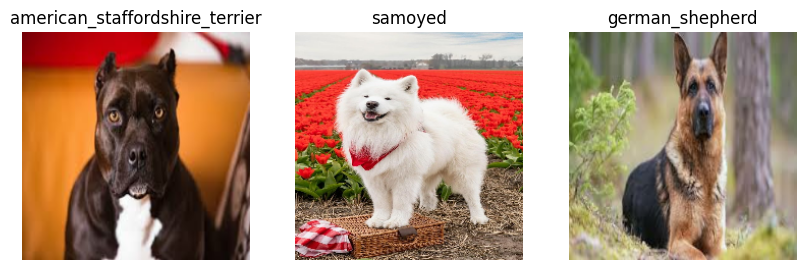

In [162]:
plt.figure(figsize=(10,10))
for i in range(len(custome_image)):
  ax=plt.subplot(1,len(custome_image),i+1)
  plt.imshow(custome_image[i])
  xticks=([])
  yticks=([])
  plt.title("{}".format(custom_preds[i]))
  plt.axis("off")